<a href="https://colab.research.google.com/github/bigyunicorn/fastai22/blob/main/lesson02/create_a_bear_classifier_and_export_it.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -Uqq fastai duckduckgo_search

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 KB 8.4 MB/s eta 0:00:00


In [ ]:
!pip show fastai duckduckgo_search

Name: fastai
Version: 2.7.12
Summary: fastai simplifies training fast and accurate neural nets using modern best practices
Home-page: https://github.com/fastai/fastai
Author: Jeremy Howard, Sylvain Gugger, and contributors
Author-email: info@fast.ai
License: Apache Software License 2.0
Location: /usr/local/lib/python3.9/dist-packages
Requires: fastcore, fastdownload, fastprogress, matplotlib, packaging, pandas, pillow, pip, pyyaml, requests, scikit-learn, scipy, spacy, torch, torchvision
Required-by: 
---
Name: duckduckgo-search
Version: 2.8.5
Summary: Search for words, documents, images, news, maps and text translation using the DuckDuckGo.com search engine.
Home-page: 
Author: deedy5
Author-email: 
License: MIT License
Location: /usr/local/lib/python3.9/dist-packages
Requires: click, requests
Required-by: 


In [ ]:
# search for one imag
from duckduckgo_search import ddg_images
from fastai.vision.all import *
from fastcore.all import *
from fastai.data.external import *

searchImg = L(ddg_images("teddy bear", max_results = 1)).itemgot("image")
print(searchImg[0])
dest = "teddybear"
download_images(dest, urls=searchImg)

#im = Image.to_thumb(searchImg[0])

https://i5.walmartimages.com/asr/5d5541cd-d9cc-4b47-b7de-ebc107b74d82_1.9f14f307142cfd730852e875760b90bc.jpeg


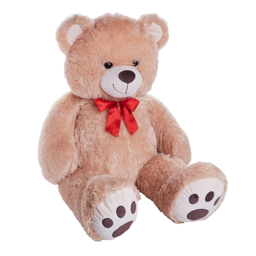

In [ ]:
im = Image.open("/content/teddybear/07d05657-5069-48ff-9242-81e08757b8ec.jpeg")
im.to_thumb(256,512)

In [ ]:
def searchImages(keyword):
  print(f"searching {keyword}")
  results = L(ddg_images(keyword)).itemgot("image")
  print(len(results))
  return results

In [ ]:
!rm -rf "./bears/grizzly bear"

In [ ]:
#download images for each bear
path = "bears"
mkdir(path)
dest1= f"{path}/grizzly bear"
urls = searchImages(dest1)
download_images(dest1, urls=urls)


dest2=f"{path}/black bear"
urls2 = searchImages(dest2)
download_images(dest2, urls=urls2)

dest3=f"{path}/teddy bear"
urls3= searchImages(dest3)
download_images(dest3, urls=urls3)

searching bears/grizzly bear
100
searching bears/black bear
100
searching bears/teddy bear
100


In [ ]:
# verify images 
# first get file paths recursively
get_image_files(dest1)

(#91) [Path('bears/grizzly bear/512cdbd3-ec30-4d67-838e-630350831a93.jpg'),Path('bears/grizzly bear/8d90e95e-a7bd-4996-9336-09abf6e841c9.jpg'),Path('bears/grizzly bear/37520089-09f9-4235-813a-e6fd16c25338.jpg'),Path('bears/grizzly bear/d20f3836-4f8e-41de-b72a-99a5aa07bac1.jpg'),Path('bears/grizzly bear/6a6620d8-5651-49a6-81ba-c34e51a707e1.jpg'),Path('bears/grizzly bear/daf7d40f-36e7-4b10-86be-4c0702ff2389.jpg'),Path('bears/grizzly bear/7c46c3ce-d1a1-4e91-9fb6-fb51d4b5b737.jpg'),Path('bears/grizzly bear/45586444-a805-4033-807d-893d0ed39455.jpg'),Path('bears/grizzly bear/71b26f04-0da3-4ed8-9340-ad479aa34632.jpg'),Path('bears/grizzly bear/be7df0b5-ef3b-4c26-a08c-c7a66546eb56.jpg')...]

In [ ]:
failed = verify_images(get_image_files(dest1))

In [ ]:
# clean up images (unlink)
failed.map(Path.unlink)

(#2) [None,None]

In [ ]:
failed2= verify_images(get_image_files(dest2))
print(len(failed2))

1


In [ ]:
failed2.map(Path.unlink)

(#1) [None]

In [ ]:
failed3= verify_images(get_image_files(dest3))
print(len(failed3))

4


In [ ]:
failed3.map(Path.unlink)

(#4) [None,None,None,None]

In [ ]:
# now as we have data/images, time for me to prepare datablocks and loaders. 
dls = DataBlock(
    blocks = (ImageBlock, CategoryBlock),
    get_items = get_image_files,
    get_y = parent_label,
    splitter = RandomSplitter(valid_pct=0.2, seed=42),
    item_tfms = RandomResizedCrop(256),
    batch_tfms= aug_transforms() 
).dataloaders(path, bs=32) 

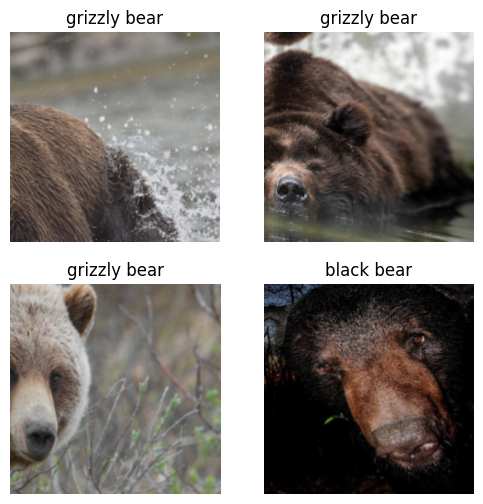

In [ ]:
dls.train.show_batch(max_n = 4, nrows=2)

In [ ]:
# create a vision learner
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,error_rate,time
0,1.439977,0.072300,0.018182,00:44


epoch,train_loss,valid_loss,error_rate,time
0,0.285680,0.062857,0.018182,01:06
1,0.233249,0.075072,0.018182,01:01
2,0.204887,0.087694,0.018182,01:00
3,0.181453,0.099340,0.018182,01:00


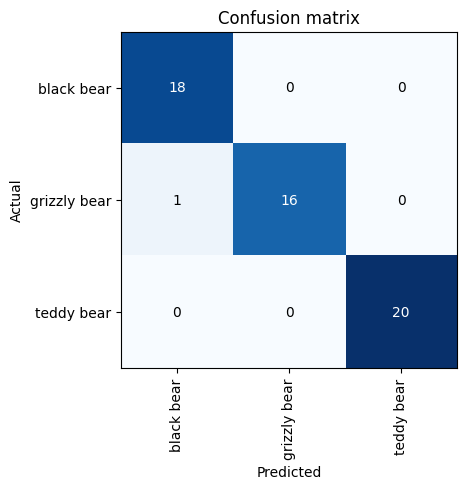

In [ ]:
# check how well the model is doing using 
obj = ClassificationInterpretation.from_learner(learn)
obj.plot_confusion_matrix()
#ClassificationInterpretation.confusion_matrix(learn)

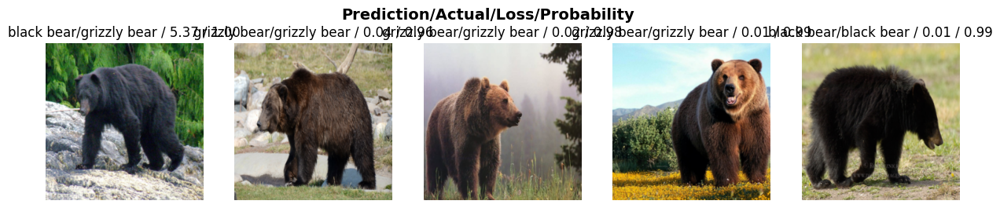

In [ ]:
obj.plot_top_losses(5, nrows=1) #It is hard to read when the label is long. 

In [ ]:
# clean up the image classificaiton 
from fastai.vision.widgets import *
cleaner = ImageClassifierCleaner(learn)
cleaner # this is necessary to show the UI.

In [ ]:
# if there is antyhing that I decided to delete or change the category, I should run the following commands (this is from the textbook)
# hide
# for idx in cleaner.delete(): cleaner.fns[idx].unlink()
# for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

In [ ]:
# train it one more time. 
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


epoch,train_loss,valid_loss,error_rate,time
0,1.236841,0.104690,0.036364,00:45


epoch,train_loss,valid_loss,error_rate,time
0,0.278273,0.057348,0.018182,01:07
1,0.251230,0.077719,0.018182,01:05
2,0.199334,0.074081,0.018182,01:00
3,0.183928,0.071769,0.018182,01:00


In [ ]:
# export the model as a pickle file. 
learn.export('yunny_bear_classifier.pkl')
# this model's datablocks and dataloaders do not have dependency on customized functions, so i think just exporting the model as it is should work. 